# AI Fridge prototype

## Steps 

* Install YOLOv5 dependencies
* Download custom YOLOv5 dataset
* Write custum configurations
* Run training
* Evaluate performance
* Test on home made pictures

## Dependencies

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5 /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/
%cd /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/
!git reset --hard 064365d8683fd002e9ad789c1e91fa3d021b44f0

Cloning into '/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5'...
remote: Enumerating objects: 15529, done.
remote: Counting objects: 100% (136/136), done.
remote: Compressing objects: 100% (134/134), done.
remote: Total 15529 (delta 47), reused 18 (delta 2), pack-reused 15393
Receiving objects: 100% (15529/15529), 14.58 MiB | 15.46 MiB/s, done.
Resolving deltas: 100% (10571/10571), done.
/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5
HEAD is now at 064365d Update parse_opt() in export.py to work as in train.py (#10789)


In [ ]:
# install dependencies
!pip install -qr /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.3/184.3 kB 6.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 7.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 50.1 MB/s eta 0:00:00


## Download custom dataset 

Downloaded the dataset from Roboflow with the YOLOv5 PyTorch export format.


In [ ]:
!pip install roboflow

In [ ]:
%cd /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5

In [ ]:
from roboflow import Roboflow
rf = Roboflow(api_key="Ec5yQvw06zZm68Y09eJp")
project = rf.workspace("greenkitchen").project("ingredients-u1v6l")
dataset = project.version(3).download("yolov5")

/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to ingredients-3 in yolov5pytorch:: 100%|██████████| 3452/3452 [00:21<00:00, 161.06it/s]


## Configuration and Architecture

Next, a YAML script was written that defines the parameters for my model.
For example, number of classes, anchors, and layers.

In [ ]:
# this is the YAML file that I need to load into the notebook with the data
%cat {dataset.location}/data.yaml

names:
- Banana
- Potato
- apple
- avocado
- broccoli
- cabbage
- carrot
- chicken
- corn
- cucumber
- egg
- eggplant
- fish
- garlic
- mushroom
- onion
- orange
- pineapple
- shrimp
- tomato
nc: 20
roboflow:
  license: CC BY 4.0
  project: ingredients-u1v6l
  url: https://universe.roboflow.com/greenkitchen/ingredients-u1v6l/dataset/3
  version: 3
  workspace: greenkitchen
test: ../test/images
train: ingredients-3/train/images
val: ingredients-3/valid/images


In [ ]:
# Number of classes
import yaml
with open(dataset.location + "/data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])
print("Number of classes: " + num_classes)

Number of classes: 20


In [ ]:
# this is the model configuration that is being used
%cat /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [ ]:
# customizing the iPython writefile so I can write my custom variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [ ]:
%%writetemplate /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/models/custom_yolov5s.yaml

# parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple

# anchors
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Focus, [64, 3]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, BottleneckCSP, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 9, BottleneckCSP, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, BottleneckCSP, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 1, SPP, [1024, [5, 9, 13]]],
   [-1, 3, BottleneckCSP, [1024, False]],  # 9
  ]

# YOLOv5 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, BottleneckCSP, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, BottleneckCSP, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, BottleneckCSP, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, BottleneckCSP, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

## Training

Arguments that can be passed:
- **img:** defines the input image size
- **batch:** determines the batch size
- **epochs:** defines the number of training epochs.
- **data:** set the path to the yaml file
- **cfg:** specify the model configuration
- **weights:** specify a custom path to weights 
- **name:** result names
- **nosave:** only save the final checkpoint
- **cache:** cache images for faster training

In [ ]:
# train yolov5s on custom data for 10 epochs and 32 batch
%%time
%cd /content/drive/MyDrive/AI-Fridge/yolov5
!python train.py --img 416 --batch 32 --epochs 10 --data /content/drive/MyDrive/AI-Fridge/yolov5/Ingredients-4/data.yaml --cfg /content/drive/MyDrive/AI-Fridge/yolov5/models/yolov5s.yaml --weights '' --name /content/drive/MyDrive/AI-Fridge/yolov5/runs/train/yolov5s_results_10  --cache

In [ ]:
# train yolov5s on custom data for 30 epochs and 16 batch
%%time
%cd /content/drive/MyDrive/AI-Fridge/yolov5
!python train.py --img 416 --batch 16 --epochs 30 --data /content/drive/MyDrive/AI-Fridge/yolov5/Ingredients-4/data.yaml --cfg /content/drive/MyDrive/AI-Fridge/yolov5/models/yolov5s.yaml --weights '' --name /content/drive/MyDrive/AI-Fridge/yolov5/runs/train/yolov5s_results_30  --cache

In [ ]:
# train yolov5s on custom data for 50 epochs and 16 batch + time its performance
%%time
%cd /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5
!python train.py --img 416 --batch 16 --epochs 50 --data /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/ingredients-3/data.yaml --cfg /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/models/yolov5s.yaml --weights '' --name /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/runs/train/yolov5s_results_50  --cache

/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5
2023-04-14 23:17:09.881867: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-14 23:17:10.705473: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=, cfg=/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/models/yolov5s.yaml, data=/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/ingredients-3/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train,

## Evaluate performance

Training losses and performance metrics are saved to Tensorboard.

In [ ]:
%load_ext tensorboard

%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
from IPython.display import Image

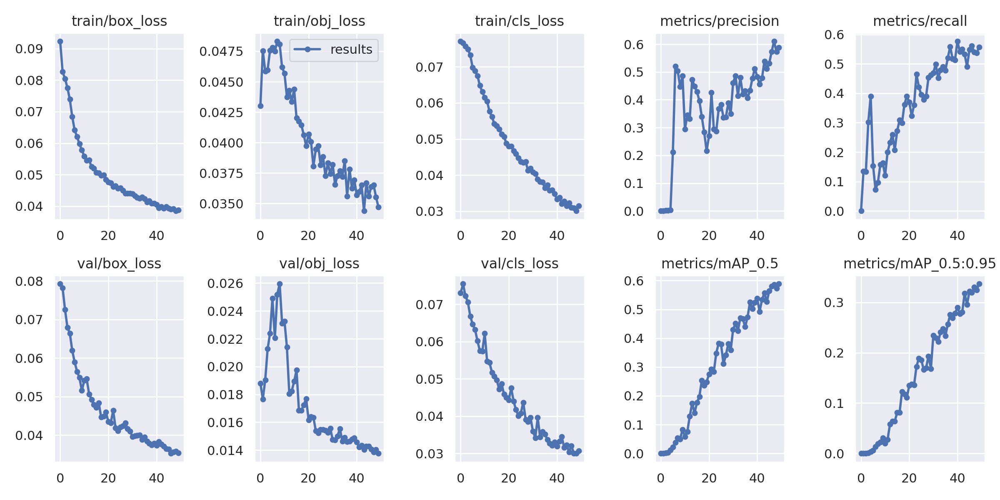

In [ ]:
# graphs 
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/runs/train/yolov5s_results_50/results.png', width=1000)

## Visualizing the data 


In [ ]:
import cv2
import matplotlib.pyplot as plt

import subprocess
import re

In [ ]:
%cd /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5

/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5


['egg', 'egg', 'Potato', 'apple', 'tomato', 'onion']


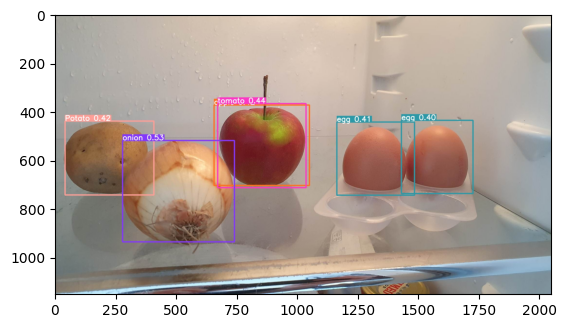

In [ ]:
# capture the output
result = !python detect.py --weights /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/runs/train/yolov5s_results_50/weights/best.pt --img 416 --conf 0.2 --source /content/drive/MyDrive/Y3/S2/Project/photos/middle_v1.jpg

# convert SList object to a string
result_str = str(result)

# extract the detected food items
match = re.search(r"Detected food items: \[(.*?)\]", result_str)
if match:
    detected_items_str = match.group(1)
    detected_items_list = detected_items_str.split(", ")
    detected_items = [item.strip("'") for item in detected_items_list]

    print(detected_items) # show list of detected food items
else:
    print("No food items detected.")

result_img_50 = cv2.imread('/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/runs/detect/exp63/middle_v1.jpg')

# display the image
plt.imshow(cv2.cvtColor(result_img_50, cv2.COLOR_BGR2RGB))
plt.show()


['egg', 'egg', 'avocado', 'corn', 'cucumber']


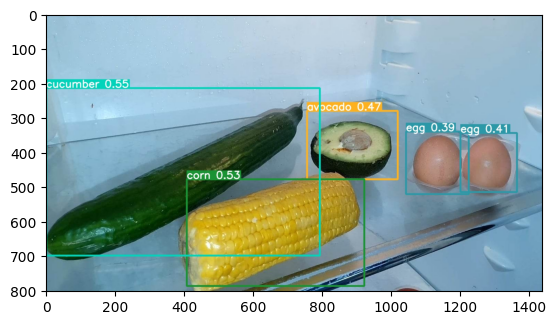

In [ ]:
result = !python detect.py --weights /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/runs/train/yolov5s_results_50/weights/best.pt --img 416 --conf 0.3 --source /content/drive/MyDrive/Y3/S2/Project/photos/upper_v2.4.jpg

result_str = str(result)

match = re.search(r"Detected food items: \[(.*?)\]", result_str)
if match:
    detected_items_str = match.group(1)
    detected_items_list = detected_items_str.split(", ")
    detected_items = [item.strip("'") for item in detected_items_list]

    print(detected_items)
else:
    print("No food items detected.")

result_img_50 = cv2.imread('/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/runs/detect/exp49/upper_v2.4.jpg')

plt.imshow(cv2.cvtColor(result_img_50, cv2.COLOR_BGR2RGB))
plt.show()


['carrot', 'broccoli', 'tomato', 'tomato', 'tomato', 'eggplant']


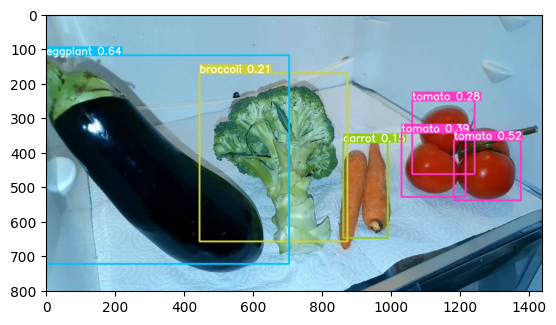

In [ ]:
result = !python detect.py --weights /content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/runs/train/yolov5s_results_50/weights/best.pt --img 416 --conf 0.1 --source /content/drive/MyDrive/Y3/S2/Project/photos/bottom_v14.2.jpg

result_str = str(result)

match = re.search(r"Detected food items: \[(.*?)\]", result_str)
if match:
    detected_items_str = match.group(1)
    detected_items_list = detected_items_str.split(", ")
    detected_items = [item.strip("'") for item in detected_items_list]

    print(detected_items)
else:
    print("No food items detected.")

result_img_50 = cv2.imread('/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/yolov5/runs/detect/exp/bottom_v14.2.jpg')

plt.imshow(cv2.cvtColor(result_img_50, cv2.COLOR_BGR2RGB))
plt.show()


# Recommender System

## Prepare the dataset

In [ ]:
import numpy as np
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import sys
import matplotlib.pyplot as plt

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Y3/S2/Project/AI-Fridge-D2/recipes_df/RAW_recipes.csv')

In [ ]:
df.head()

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients
0,arriba baked winter squash mexican style,137739,55,47892,2005-09-16,"['60-minutes-or-less', 'time-to-make', 'course...","[51.5, 0.0, 13.0, 0.0, 2.0, 0.0, 4.0]",11,"['make a choice and proceed with recipe', 'dep...",autumn is my favorite time of year to cook! th...,"['winter squash', 'mexican seasoning', 'mixed ...",7
1,a bit different breakfast pizza,31490,30,26278,2002-06-17,"['30-minutes-or-less', 'time-to-make', 'course...","[173.4, 18.0, 0.0, 17.0, 22.0, 35.0, 1.0]",9,"['preheat oven to 425 degrees f', 'press dough...",this recipe calls for the crust to be prebaked...,"['prepared pizza crust', 'sausage patty', 'egg...",6
2,all in the kitchen chili,112140,130,196586,2005-02-25,"['time-to-make', 'course', 'preparation', 'mai...","[269.8, 22.0, 32.0, 48.0, 39.0, 27.0, 5.0]",6,"['brown ground beef in large pot', 'add choppe...",this modified version of 'mom's' chili was a h...,"['ground beef', 'yellow onions', 'diced tomato...",13
3,alouette potatoes,59389,45,68585,2003-04-14,"['60-minutes-or-less', 'time-to-make', 'course...","[368.1, 17.0, 10.0, 2.0, 14.0, 8.0, 20.0]",11,['place potatoes in a large pot of lightly sal...,"this is a super easy, great tasting, make ahea...","['spreadable cheese with garlic and herbs', 'n...",11
4,amish tomato ketchup for canning,44061,190,41706,2002-10-25,"['weeknight', 'time-to-make', 'course', 'main-...","[352.9, 1.0, 337.0, 23.0, 3.0, 0.0, 28.0]",5,['mix all ingredients& boil for 2 1 / 2 hours ...,my dh's amish mother raised him on this recipe...,"['tomato juice', 'apple cider vinegar', 'sugar...",8


## Preprocess the data

In [ ]:
# splitting the "nutrition" column - (PDV = percentage daily value)

df[['calories','total fat (PDV)','sugar (PDV)','sodium (PDV)','protein (PDV)','saturated fat (PDV)','carbohydrates (PDV)']] = df.nutrition.str.split(",",expand=True) 

In [ ]:
df.head()

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,calories,total fat (PDV),sugar (PDV),sodium (PDV),protein (PDV),saturated fat (PDV),carbohydrates (PDV)
0,arriba baked winter squash mexican style,137739,55,47892,2005-09-16,"['60-minutes-or-less', 'time-to-make', 'course...","[51.5, 0.0, 13.0, 0.0, 2.0, 0.0, 4.0]",11,"['make a choice and proceed with recipe', 'dep...",autumn is my favorite time of year to cook! th...,"['winter squash', 'mexican seasoning', 'mixed ...",7,[51.5,0.0,13.0,0.0,2.0,0.0,4.0]
1,a bit different breakfast pizza,31490,30,26278,2002-06-17,"['30-minutes-or-less', 'time-to-make', 'course...","[173.4, 18.0, 0.0, 17.0, 22.0, 35.0, 1.0]",9,"['preheat oven to 425 degrees f', 'press dough...",this recipe calls for the crust to be prebaked...,"['prepared pizza crust', 'sausage patty', 'egg...",6,[173.4,18.0,0.0,17.0,22.0,35.0,1.0]
2,all in the kitchen chili,112140,130,196586,2005-02-25,"['time-to-make', 'course', 'preparation', 'mai...","[269.8, 22.0, 32.0, 48.0, 39.0, 27.0, 5.0]",6,"['brown ground beef in large pot', 'add choppe...",this modified version of 'mom's' chili was a h...,"['ground beef', 'yellow onions', 'diced tomato...",13,[269.8,22.0,32.0,48.0,39.0,27.0,5.0]
3,alouette potatoes,59389,45,68585,2003-04-14,"['60-minutes-or-less', 'time-to-make', 'course...","[368.1, 17.0, 10.0, 2.0, 14.0, 8.0, 20.0]",11,['place potatoes in a large pot of lightly sal...,"this is a super easy, great tasting, make ahea...","['spreadable cheese with garlic and herbs', 'n...",11,[368.1,17.0,10.0,2.0,14.0,8.0,20.0]
4,amish tomato ketchup for canning,44061,190,41706,2002-10-25,"['weeknight', 'time-to-make', 'course', 'main-...","[352.9, 1.0, 337.0, 23.0, 3.0, 0.0, 28.0]",5,['mix all ingredients& boil for 2 1 / 2 hours ...,my dh's amish mother raised him on this recipe...,"['tomato juice', 'apple cider vinegar', 'sugar...",8,[352.9,1.0,337.0,23.0,3.0,0.0,28.0]


In [ ]:
df['calories'] =  df['calories'].apply(lambda x: x.replace('[','')) 
df['carbohydrates (PDV)'] =  df['carbohydrates (PDV)'].apply(lambda x: x.replace(']','')) 

In [ ]:
df.head()

,name,id,minutes,contributor_id,submitted,tags,nutrition,n_steps,steps,description,ingredients,n_ingredients,calories,total fat (PDV),sugar (PDV),sodium (PDV),protein (PDV),saturated fat (PDV),carbohydrates (PDV)
0,arriba baked winter squash mexican style,137739,55,47892,2005-09-16,"['60-minutes-or-less', 'time-to-make', 'course...","[51.5, 0.0, 13.0, 0.0, 2.0, 0.0, 4.0]",11,"['make a choice and proceed with recipe', 'dep...",autumn is my favorite time of year to cook! th...,"['winter squash', 'mexican seasoning', 'mixed ...",7,51.5,0.0,13.0,0.0,2.0,0.0,4.0
1,a bit different breakfast pizza,31490,30,26278,2002-06-17,"['30-minutes-or-less', 'time-to-make', 'course...","[173.4, 18.0, 0.0, 17.0, 22.0, 35.0, 1.0]",9,"['preheat oven to 425 degrees f', 'press dough...",this recipe calls for the crust to be prebaked...,"['prepared pizza crust', 'sausage patty', 'egg...",6,173.4,18.0,0.0,17.0,22.0,35.0,1.0
2,all in the kitchen chili,112140,130,196586,2005-02-25,"['time-to-make', 'course', 'preparation', 'mai...","[269.8, 22.0, 32.0, 48.0, 39.0, 27.0, 5.0]",6,"['brown ground beef in large pot', 'add choppe...",this modified version of 'mom's' chili was a h...,"['ground beef', 'yellow onions', 'diced tomato...",13,269.8,22.0,32.0,48.0,39.0,27.0,5.0
3,alouette potatoes,59389,45,68585,2003-04-14,"['60-minutes-or-less', 'time-to-make', 'course...","[368.1, 17.0, 10.0, 2.0, 14.0, 8.0, 20.0]",11,['place potatoes in a large pot of lightly sal...,"this is a super easy, great tasting, make ahea...","['spreadable cheese with garlic and herbs', 'n...",11,368.1,17.0,10.0,2.0,14.0,8.0,20.0
4,amish tomato ketchup for canning,44061,190,41706,2002-10-25,"['weeknight', 'time-to-make', 'course', 'main-...","[352.9, 1.0, 337.0, 23.0, 3.0, 0.0, 28.0]",5,['mix all ingredients& boil for 2 1 / 2 hours ...,my dh's amish mother raised him on this recipe...,"['tomato juice', 'apple cider vinegar', 'sugar...",8,352.9,1.0,337.0,23.0,3.0,0.0,28.0


In [ ]:
df.dtypes

name                   object
id                      int64
minutes                 int64
contributor_id          int64
submitted              object
tags                   object
nutrition              object
n_steps                 int64
steps                  object
description            object
ingredients            object
n_ingredients           int64
calories               object
total fat (PDV)        object
sugar (PDV)            object
sodium (PDV)           object
protein (PDV)          object
saturated fat (PDV)    object
carbohydrates (PDV)    object
dtype: object

In [ ]:
df[['calories','total fat (PDV)','sugar (PDV)','sodium (PDV)','protein (PDV)','saturated fat (PDV)','carbohydrates (PDV)']] = df[['calories','total fat (PDV)','sugar (PDV)','sodium (PDV)','protein (PDV)','saturated fat (PDV)','carbohydrates (PDV)']].astype('float')
df.dtypes

name                    object
id                       int64
minutes                  int64
contributor_id           int64
submitted               object
tags                    object
nutrition               object
n_steps                  int64
steps                   object
description             object
ingredients             object
n_ingredients            int64
calories               float64
total fat (PDV)        float64
sugar (PDV)            float64
sodium (PDV)           float64
protein (PDV)          float64
saturated fat (PDV)    float64
carbohydrates (PDV)    float64
dtype: object

In [ ]:
df.drop(['id', 'contributor_id','submitted','tags','nutrition'], axis=1,inplace = True)

In [ ]:
df.head()

,name,minutes,n_steps,steps,description,ingredients,n_ingredients,calories,total fat (PDV),sugar (PDV),sodium (PDV),protein (PDV),saturated fat (PDV),carbohydrates (PDV)
0,arriba baked winter squash mexican style,55,11,"['make a choice and proceed with recipe', 'dep...",autumn is my favorite time of year to cook! th...,"['winter squash', 'mexican seasoning', 'mixed ...",7,51.5,0.0,13.0,0.0,2.0,0.0,4.0
1,a bit different breakfast pizza,30,9,"['preheat oven to 425 degrees f', 'press dough...",this recipe calls for the crust to be prebaked...,"['prepared pizza crust', 'sausage patty', 'egg...",6,173.4,18.0,0.0,17.0,22.0,35.0,1.0
2,all in the kitchen chili,130,6,"['brown ground beef in large pot', 'add choppe...",this modified version of 'mom's' chili was a h...,"['ground beef', 'yellow onions', 'diced tomato...",13,269.8,22.0,32.0,48.0,39.0,27.0,5.0
3,alouette potatoes,45,11,['place potatoes in a large pot of lightly sal...,"this is a super easy, great tasting, make ahea...","['spreadable cheese with garlic and herbs', 'n...",11,368.1,17.0,10.0,2.0,14.0,8.0,20.0
4,amish tomato ketchup for canning,190,5,['mix all ingredients& boil for 2 1 / 2 hours ...,my dh's amish mother raised him on this recipe...,"['tomato juice', 'apple cider vinegar', 'sugar...",8,352.9,1.0,337.0,23.0,3.0,0.0,28.0


In [ ]:
print(df['ingredients'])

0         ['winter squash', 'mexican seasoning', 'mixed ...
1         ['prepared pizza crust', 'sausage patty', 'egg...
2         ['ground beef', 'yellow onions', 'diced tomato...
3         ['spreadable cheese with garlic and herbs', 'n...
4         ['tomato juice', 'apple cider vinegar', 'sugar...
                                ...                        
231632    ['celery', 'onion', 'green sweet pepper', 'gar...
231633    ['paprika', 'salt', 'garlic powder', 'onion po...
231634    ['hard-cooked eggs', 'mayonnaise', 'dijon must...
231635    ['butter', 'eagle brand condensed milk', 'ligh...
231636    ['granulated sugar', 'shortening', 'eggs', 'fl...
Name: ingredients, Length: 231637, dtype: object


In [ ]:
df['food types'] = np.nan
df['food types'] = df['food types'].astype('str')

In [ ]:
df.head()

,name,minutes,n_steps,steps,description,ingredients,n_ingredients,calories,total fat (PDV),sugar (PDV),sodium (PDV),protein (PDV),saturated fat (PDV),carbohydrates (PDV),food types
0,arriba baked winter squash mexican style,55,11,"['make a choice and proceed with recipe', 'dep...",autumn is my favorite time of year to cook! th...,"['winter squash', 'mexican seasoning', 'mixed ...",7,51.5,0.0,13.0,0.0,2.0,0.0,4.0,nan
1,a bit different breakfast pizza,30,9,"['preheat oven to 425 degrees f', 'press dough...",this recipe calls for the crust to be prebaked...,"['prepared pizza crust', 'sausage patty', 'egg...",6,173.4,18.0,0.0,17.0,22.0,35.0,1.0,nan
2,all in the kitchen chili,130,6,"['brown ground beef in large pot', 'add choppe...",this modified version of 'mom's' chili was a h...,"['ground beef', 'yellow onions', 'diced tomato...",13,269.8,22.0,32.0,48.0,39.0,27.0,5.0,nan
3,alouette potatoes,45,11,['place potatoes in a large pot of lightly sal...,"this is a super easy, great tasting, make ahea...","['spreadable cheese with garlic and herbs', 'n...",11,368.1,17.0,10.0,2.0,14.0,8.0,20.0,nan
4,amish tomato ketchup for canning,190,5,['mix all ingredients& boil for 2 1 / 2 hours ...,my dh's amish mother raised him on this recipe...,"['tomato juice', 'apple cider vinegar', 'sugar...",8,352.9,1.0,337.0,23.0,3.0,0.0,28.0,nan


In [ ]:
# if ingredient = chocholate, cookies or ice cream ->
# check if it has eggs. If it doesn't have eggs > vegan
#                       If it doen have eggs > non-vegan

def label_food_type(ingredients):
    if 'ice-cream' in ingredients or 'chocolate' in ingredients or 'cookies' in ingredients:
        if 'eggs' not in ingredients:
            return 'Veg dessert'
        else:
            return 'Non-Veg dessert'
    return None

df['food types'] = df['ingredients'].apply(label_food_type)

In [ ]:
# show vegan dessert recipes

veg_dessert_recipes = df.loc[df['food types'] == 'Veg dessert', ['name', 'food types']]
print(veg_dessert_recipes)

                                                     name   food types
8                                bananas 4 ice cream  pie  Veg dessert
68                     no bake  cookie crumble cheesecake  Veg dessert
103                                       turtle  squares  Veg dessert
123                                    100 chocolate cake  Veg dessert
132                           50 chili   for the crockpot  Veg dessert
...                                                   ...          ...
231250  zucchini muffins with chocolate chips and hone...  Veg dessert
231305                     zucchini peanut butter cookies  Veg dessert
231524                    zucchini chocolate chip muffins  Veg dessert
231563                                           zuccotto  Veg dessert
231591                                      zuppa inglese  Veg dessert

[9532 rows x 2 columns]


In [ ]:
# show non-vegan dessert recipes

non_veg_dessert_recipes = df.loc[df['food types'] == 'Non-Veg dessert', ['name', 'food types']]
print(non_veg_dessert_recipes)

                                                     name       food types
72                                      one pot  brownies  Non-Veg dessert
94                                     symphony  brownies  Non-Veg dessert
95                     the best  banana bread  or muffins  Non-Veg dessert
96               the best  chocolate chip cheesecake ever  Non-Veg dessert
111                  1 brownies in the world    best ever  Non-Veg dessert
...                                                   ...              ...
231107                            zucchini chocolate cake  Non-Veg dessert
231108         zucchini chocolate cake with baked topping  Non-Veg dessert
231110                   zucchini chocolate chip cupcakes  Non-Veg dessert
231111                    zucchini chocolate chip muffins  Non-Veg dessert
231525  zucchini chocolate chunk muffins with pistachi...  Non-Veg dessert

[5162 rows x 2 columns]


In [ ]:
# if the food type is not a dessert and is between 20 and 300 calories, the food is labled healthy

def label_healthy_food(row):
    food_type = row['food types']
    calories = row['calories']
    
    if food_type != 'Veg dessert' and food_type != 'Non-Veg dessert' and 20 < calories < 300:
        return 'Healthy'
    return food_type

df['food types'] = df.apply(label_healthy_food, axis=1)

In [ ]:
# show healthy recipes

healthy_recipes = df.loc[df['food types'] == 'Healthy', ['name', 'food types']]
print(healthy_recipes)

                                                name food types
0         arriba   baked winter squash mexican style    Healthy
1                   a bit different  breakfast pizza    Healthy
2                          all in the kitchen  chili    Healthy
5                            apple a day  milk shake    Healthy
10                       berry  good sandwich spread    Healthy
...                                              ...        ...
231628                            zydeco green beans    Healthy
231630                                  zydeco sauce    Healthy
231634                     zydeco ya ya deviled eggs    Healthy
231635        cookies by design   cookies on a stick    Healthy
231636  cookies by design   sugar shortbread cookies    Healthy

[100579 rows x 2 columns]


In [ ]:
# if the food type is not a dessert and if it has chicken, eggs, ham or pepperoni, the food is labled non-vegan

def label_non_veg_food(row):
    food_type = row['food types']
    ingredients = row['ingredients']
    
    if food_type != 'Veg dessert' and food_type != 'Non-Veg dessert' and food_type != 'Healthy':
        if 'chicken' in ingredients or 'eggs' in ingredients or 'ham' in ingredients or 'pepperoni' in ingredients:
            return 'Non-veg'
    return food_type

df['food types'] = df.apply(label_non_veg_food, axis=1)

In [ ]:
# show non-vegan recipes

non_veg_recipes = df.loc[df['food types'] == 'Non-veg', ['name', 'food types']]
print(non_veg_recipes)

                                                name food types
9                            beat this  banana bread    Non-veg
11                     better than sex  strawberries    Non-veg
12                   better then bush s  baked beans    Non-veg
13                        boat house  collard greens    Non-veg
18                                chinese  chop suey    Non-veg
...                                              ...        ...
231608                     zurie s chicken liver pat    Non-veg
231609  zurie s holey rustic olive and cheddar bread    Non-veg
231624   zwiebelkuchen   southwest german onion cake    Non-veg
231627                  zwiebelwhe  swiss onion tart    Non-veg
231632                                   zydeco soup    Non-veg

[45948 rows x 2 columns]


In [ ]:
# if the food type is not a dessert and if its not labled healthy and non vegan, it will be labled vegan.

def label_veg_food(food_type):
    if food_type != 'Veg dessert' and food_type != 'Non-Veg dessert' and food_type != 'Healthy' and food_type != 'Non-veg':
        return 'Veg'
    return food_type

df['food types'] = df['food types'].apply(label_veg_food)

In [ ]:
veg_recipes = df.loc[df['food types'] == 'Veg', ['name', 'food types']]
print(veg_recipes)

                                      name food types
3                       alouette  potatoes        Veg
4       amish  tomato ketchup  for canning        Veg
6                    aww  marinated olives        Veg
7           backyard style  barbecued ribs        Veg
14                 calm your nerves  tonic        Veg
...                                    ...        ...
231619         zwicker inn seafood chowder        Veg
231623          zwiebelfleisch  onion beef        Veg
231629                        zydeco salad        Veg
231631                  zydeco shrimp wrap        Veg
231633                    zydeco spice mix        Veg

[70416 rows x 2 columns]


In [ ]:
df['food types'].value_counts()

Healthy            100579
Veg                 70416
Non-veg             45948
Veg dessert          9532
Non-Veg dessert      5162
Name: food types, dtype: int64

In [ ]:
df['food types'].isnull().sum()

0

In [ ]:
df.head(10)

,name,minutes,n_steps,steps,description,ingredients,n_ingredients,calories,total fat (PDV),sugar (PDV),sodium (PDV),protein (PDV),saturated fat (PDV),carbohydrates (PDV),food types
0,arriba baked winter squash mexican style,55,11,"['make a choice and proceed with recipe', 'dep...",autumn is my favorite time of year to cook! th...,"['winter squash', 'mexican seasoning', 'mixed ...",7,51.5,0.0,13.0,0.0,2.0,0.0,4.0,Healthy
1,a bit different breakfast pizza,30,9,"['preheat oven to 425 degrees f', 'press dough...",this recipe calls for the crust to be prebaked...,"['prepared pizza crust', 'sausage patty', 'egg...",6,173.4,18.0,0.0,17.0,22.0,35.0,1.0,Healthy
2,all in the kitchen chili,130,6,"['brown ground beef in large pot', 'add choppe...",this modified version of 'mom's' chili was a h...,"['ground beef', 'yellow onions', 'diced tomato...",13,269.8,22.0,32.0,48.0,39.0,27.0,5.0,Healthy
3,alouette potatoes,45,11,['place potatoes in a large pot of lightly sal...,"this is a super easy, great tasting, make ahea...","['spreadable cheese with garlic and herbs', 'n...",11,368.1,17.0,10.0,2.0,14.0,8.0,20.0,Veg
4,amish tomato ketchup for canning,190,5,['mix all ingredients& boil for 2 1 / 2 hours ...,my dh's amish mother raised him on this recipe...,"['tomato juice', 'apple cider vinegar', 'sugar...",8,352.9,1.0,337.0,23.0,3.0,0.0,28.0,Veg
5,apple a day milk shake,0,4,"['combine ingredients in blender', 'cover and ...",NaN,"['milk', 'vanilla ice cream', 'frozen apple ju...",4,160.2,10.0,55.0,3.0,9.0,20.0,7.0,Healthy
6,aww marinated olives,15,4,['toast the fennel seeds and lightly crush the...,my italian mil was thoroughly impressed by my ...,"['fennel seeds', 'green olives', 'ripe olives'...",9,380.7,53.0,7.0,24.0,6.0,24.0,6.0,Veg
7,backyard style barbecued ribs,120,10,['in a medium saucepan combine all the ingredi...,this recipe is posted by request and was origi...,"['pork spareribs', 'soy sauce', 'fresh garlic'...",22,1109.5,83.0,378.0,275.0,96.0,86.0,36.0,Veg
8,bananas 4 ice cream pie,180,8,"['crumble cookies into a 9-inch pie plate , or...",NaN,"['chocolate sandwich style cookies', 'chocolat...",6,4270.8,254.0,1306.0,111.0,127.0,431.0,220.0,Veg dessert
9,beat this banana bread,70,12,"['preheat oven to 350 degrees', 'butter two 9x...",from ann hodgman's,"['sugar', 'unsalted butter', 'bananas', 'eggs'...",9,2669.3,160.0,976.0,107.0,62.0,310.0,138.0,Non-veg


## Recommender System

In [ ]:
print(detected_items)

['carrot', 'broccoli', 'tomato', 'tomato', 'tomato', 'eggplant']


In [ ]:
matches = df[df['ingredients'].apply(lambda x: all(item in x for item in detected_items))]

if not matches.empty:
    for index, row in matches.iterrows():
        print(f"Recipe Name: {row['name']}\nFood Type: {row['food types']}\nIngredients: {row['ingredients']}\n")
else:
    print("No matches found.")


Recipe Name: healthy  hearty italian dinner
Food Type: Healthy
Ingredients: ['onion', 'baby carrots', 'garlic clove', 'yellow squash', 'frozen spinach', 'canned artichoke hearts', 'chickpeas', 'canned mushrooms', 'spaghetti sauce', 'italian seasoning', 'basil', 'oregano', 'vegetable stock', 'vermouth', 'olive oil', 'salt', 'eggplant', 'beans', 'swiss chard', 'escarole', 'broccoli floret', 'cauliflower floret', 'diced tomato', 'prepared polenta', 'garlic powder']

Recipe Name: jardiniere
Food Type: Healthy
Ingredients: ['green beans', 'bell pepper', 'broccoli floret', 'cabbage', 'carrot', 'cauliflower floret', 'celery', 'cucumber', 'eggplant', 'green cherry tomatoes', 'green tomato', 'jerusalem artichoke', 'mushroom', 'okra', 'onion', 'radish', 'white onion', 'zucchini', 'salt', 'garlic', 'peppercorns', 'thai peppers', 'vinegar', 'water']

Recipe Name: vegetable and tomato casserole
Food Type: Healthy
Ingredients: ['olive oil', 'onion', 'garlic cloves', 'carrots', 'potatoes', 'celery ri